## Display the sample image and import the .json file with labels.

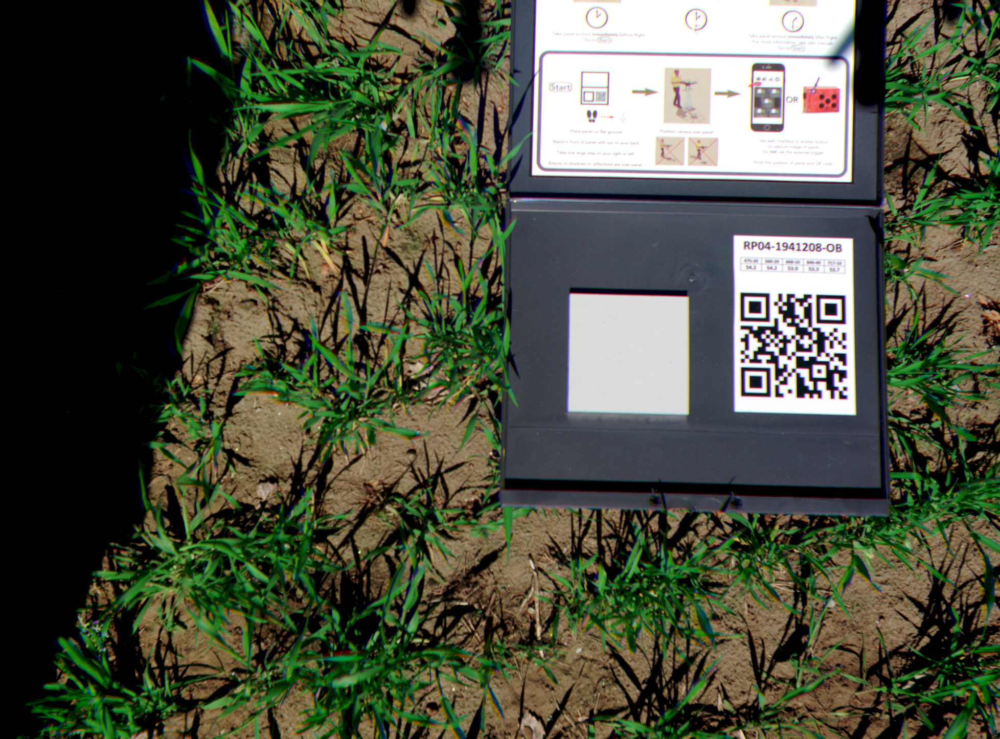

In [1]:
from IPython.display import Image
Image(filename="labeling_project/upload/image.png") 

In [2]:
import shapely.geometry as sg
import shapely.ops as so
import matplotlib.pyplot as plt
import numpy as np

In [3]:
import json
with open('result.json') as json_file: 
    data = json.load(json_file)
# Unwrapping json
data = (data[0]["completions"][0]["result"])

## Get the pixel coordinates of a label.
Save the resulted mask of labels as an image.

In [4]:
def coordinate(label):
    z = 0
    allrr = np.empty([0], dtype = np.int64)
    allcc = np.empty([0], dtype = np.int64)
    while z < len(data):
        if data[z]["value"]["polygonlabels"][0] == label:
            coordinates = (data[z]["value"]["points"])
            i = 0
            r = []
            c = []
            while i < len(coordinates):
                r.append(coordinates[i][1] / 100 * 1446 - 0.5)
                c.append(coordinates[i][0] / 100 * 1956 - 0.5)
                i = i + 1
            rr, cc = polygon(r, c, shape=[1446, 1956])
            allrr = np.append(allrr, rr)
            allcc = np.append(allcc, cc)
        z = z + 1
    return [allrr, allcc]

In [5]:
from skimage.draw import polygon
manualClassification = np.zeros((1446, 1956, 3), dtype = np.uint8)
manualClassification[tuple(coordinate("Vegetation"))] = [0,255,0]
manualClassification[tuple(coordinate("Soil"))] = [165,42,42]
manualClassification[tuple(coordinate("Ignore"))] = [255,0,255]
classToRGB = {"Vegetation": [0,255,0], "Soil": [165,42,42], "Ignore": [255,0,255], "Unknown": [0, 0, 0]}
plt.imsave('maskedImg.png', manualClassification)

## Get the RGB colour of each labelled pixel.
Import the sample image as a numpy array of RGB colours. Select the pixels which belong to each label and find what their RGB colour looks like on the sample image.

In [6]:
import PIL
photo = np.array(PIL.Image.open("labeling_project/upload/image.png").convert("RGB"))
#print(photo[1445, 1955]) # [y, x]

Return colour of the pixels of the original image which correspond to the labelled pixels' given color:

In [7]:
def pixelToRGB(imageRGB, mask, rgb): # rgb = [r, g, b]
    return imageRGB[np.where(np.all(mask[:,:] == rgb, axis=2))]

Return the boolean list of whether the pixels belong to a certain label:

In [8]:
def selectPixelsInClass(mask, label):
    return np.all(mask[:,:] == classToRGB[label], axis=2)

In [9]:
vegetationPixelsRGB = pixelToRGB(photo, manualClassification, [0, 255, 0])
soilPixelsRGB = pixelToRGB(photo, manualClassification, [165,42,42])
#print(vegetationPixelsRGB)

## Get the descriptive statistics on the colouring of each label on the sample image
Use the list of the pixel colours derived from the original image.

In [10]:
def descriptives(list):
    print("Number of observations: " + str(len(list[0])))
    print("Median: " + str(int(np.percentile(list[0], 50))) + " " + str(int(np.percentile(list[1], 50))) + " " + str(int(np.percentile(list[2], 50))))
    print("75th percentile: " + str(int(np.percentile(list[0], 75))) + " " + str(int(np.percentile(list[1], 75))) + " " + str(int(np.percentile(list[2], 75))))
    print("25th percentile: " + str(int(np.percentile(list[0], 25))) + " " + str(int(np.percentile(list[1], 25))) + " " + str(int(np.percentile(list[2], 25))))
    print("99th percentile: " + str(int(np.percentile(list[0], 99))) + " " + str(int(np.percentile(list[1], 99))) + " " + str(int(np.percentile(list[2], 99))))
    print("1st percentile: " + str(int(np.percentile(list[0], 1))) + " " + str(int(np.percentile(list[1], 1))) + " " + str(int(np.percentile(list[2], 1))))
    kwargs = dict(alpha=0.3, bins=50)
    plt.hist((list[0]), **kwargs, color='r')
    plt.hist((list[1]), **kwargs, color='g')
    plt.hist((list[2]), **kwargs, color='b')
    plt.gca().set(title='RGB distribution', ylabel='Frequency')
    plt.xlim(0,256)
    plt.show();

Number of observations: 84792
Median: 42 120 42
75th percentile: 56 139 50
25th percentile: 22 90 22
99th percentile: 113 168 99
1st percentile: 0 22 0


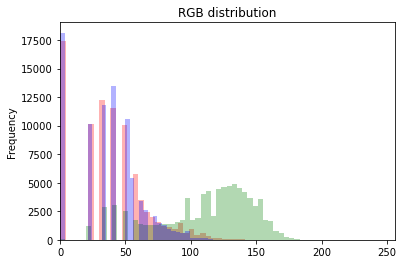

In [11]:
descriptives(np.transpose(vegetationPixelsRGB))

Number of observations: 461350
Median: 120 96 61
75th percentile: 139 118 86
25th percentile: 71 50 34
99th percentile: 167 147 120
1st percentile: 0 0 0


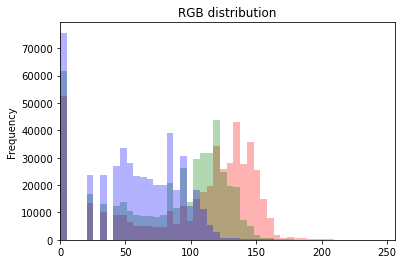

In [12]:
descriptives(np.transpose(soilPixelsRGB))

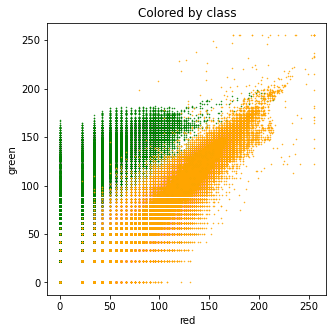

In [13]:
plt.figure(figsize=(5, 5))
plt.scatter(vegetationPixelsRGB[:,0], vegetationPixelsRGB[:,1], marker='.', s=1, color="green")
plt.scatter(soilPixelsRGB[:,0], soilPixelsRGB[:,1], marker='.', s=1, color="orange")
plt.title("Colored by class")
plt.xlabel("red")
plt.ylabel("green");

## Principal component analysis (PCA)
Do PCA on the pixel colors. Extract 2 principal components.

In [14]:
from sklearn.decomposition import PCA
soilVegRGB = np.concatenate((soilPixelsRGB, vegetationPixelsRGB))
y = np.concatenate((np.repeat(0, np.shape(soilPixelsRGB)[0]), np.repeat(1, np.shape(vegetationPixelsRGB)[0])))
pcaFit = PCA(n_components=2).fit(soilVegRGB)
soilVegRGBY = np.concatenate((soilVegRGB, np.transpose([y])), axis = 1)
np.random.shuffle(soilVegRGBY) # only shuffles the array along the first axis
principalComponents = pcaFit.transform(soilVegRGBY[:,0:3])

## Logistic regression
Do logistic regression on the pixel colors. It is expected that the split will be mostly based on the first principal component. The model predicts the class of pixels, the probabilities of the pixels belonging to each class and the mean accuracy of the predicitions. Remove the intercept to specify uncertainty in the shadows.

In [15]:
from sklearn.linear_model import LogisticRegression
clf = LogisticRegression(random_state=0, fit_intercept = False).fit(soilVegRGB, y)
clfAlpha =  LogisticRegression(random_state=0, fit_intercept = True).fit(soilVegRGB, y)
print(clf.predict(soilVegRGB))
print(clf.predict_proba(soilVegRGB))
print(clf.score(soilVegRGB, y))
#print(clf.coef_)
#import statsmodels.api as sm
#log_reg = sm.Logit(y, soilVegRGB).fit()
#print(log_reg.summary())

[0 0 0 ... 1 1 1]
[[9.99941152e-01 5.88477925e-05]
 [9.99946495e-01 5.35049600e-05]
 [9.99984796e-01 1.52040777e-05]
 ...
 [8.82014391e-04 9.99117986e-01]
 [5.50466934e-03 9.94495331e-01]
 [6.80575634e-04 9.99319424e-01]]
0.9908558580003003


## Principal component analysis (PCA)
Plot pixels in random order.

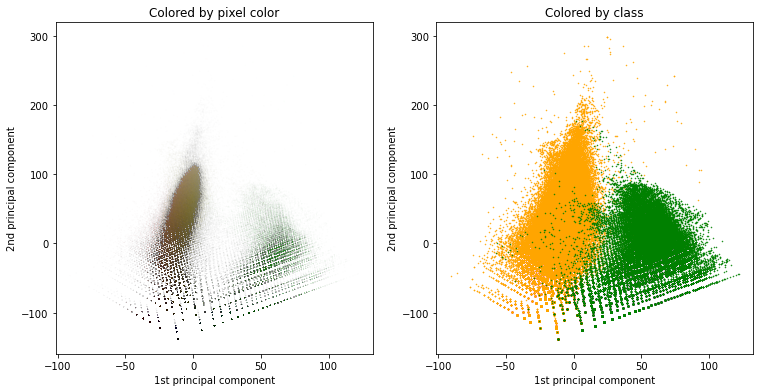

In [37]:
fig = plt.figure(figsize=(12.5, 6.1))
ax = fig.add_subplot(1, 2, 1)
ax.set_title("Colored by pixel color");
ax.set_xlabel("1st principal component")
ax.set_ylabel("2nd principal component")
ax.title.set_text('Colored by pixel color')
ax.scatter(principalComponents[:, 1], principalComponents[:, 0], marker='.', s=1, color=soilVegRGBY[:,0:3]/255.0, alpha = 0.01)
ax = fig.add_subplot(1, 2, 2)
ax.title.set_text('Colored by class')
ax.set_xlabel("1st principal component")
ax.set_ylabel("2nd principal component")
# Add alpha to see the concentration.
ax.scatter(principalComponents[soilVegRGBY[:,3] == 0, 1], principalComponents[soilVegRGBY[:,3] == 0, 0], marker='.', s=1, color="orange", alpha = 1)
ax.scatter(principalComponents[soilVegRGBY[:,3] == 1, 1], principalComponents[soilVegRGBY[:,3] == 1, 0], marker='.', s=1, color="green", alpha = 1);

Plot pixels in random order, using the class probabilities. If the model's score is high, the number of transparent pixels, which represent the uncertainty, will be small.

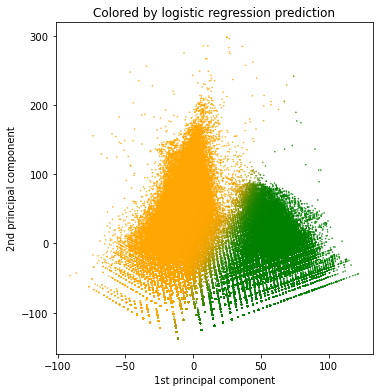

In [39]:
fig = plt.figure(figsize=(12.5, 6.1))
ax = fig.add_subplot(1, 2, 1)
ax.set_title("Colored by pixel color");
ax.set_xlabel("1st principal component")
ax.set_ylabel("2nd principal component")
ax.title.set_text('Colored by logistic regression prediction')
soilVegRGBY_predicted_proba = clf.predict_proba(soilVegRGBY[:,0:3])
ax.scatter(principalComponents[:, 1], principalComponents[:, 0], marker='.', s=1, color=[1, 0.65, 0] * np.transpose([soilVegRGBY_predicted_proba[:,0]]) + [0, 0.5, 0] * np.transpose([soilVegRGBY_predicted_proba[:,1]]));

## Mask on model predictions
Create a masked image based on model predictions of the colour. 

In [18]:
def colorOnPredictClass(RGB, model, soilColors, vegColors):
    RGBout = soilColors * np.transpose([model.predict_proba(RGB)[:,0]]) + vegColors * np.transpose([model.predict_proba(RGB)[:,1]])
    return RGBout

In [19]:
def maskOnPredictClass(npImage, model, soilColors, vegColors):
    c = np.reshape(colorOnPredictClass(np.reshape(npImage, (npImage.shape[0] * npImage.shape[1], 3)), model, soilColors, vegColors), npImage.shape)
    return (c * 255).astype('uint8')

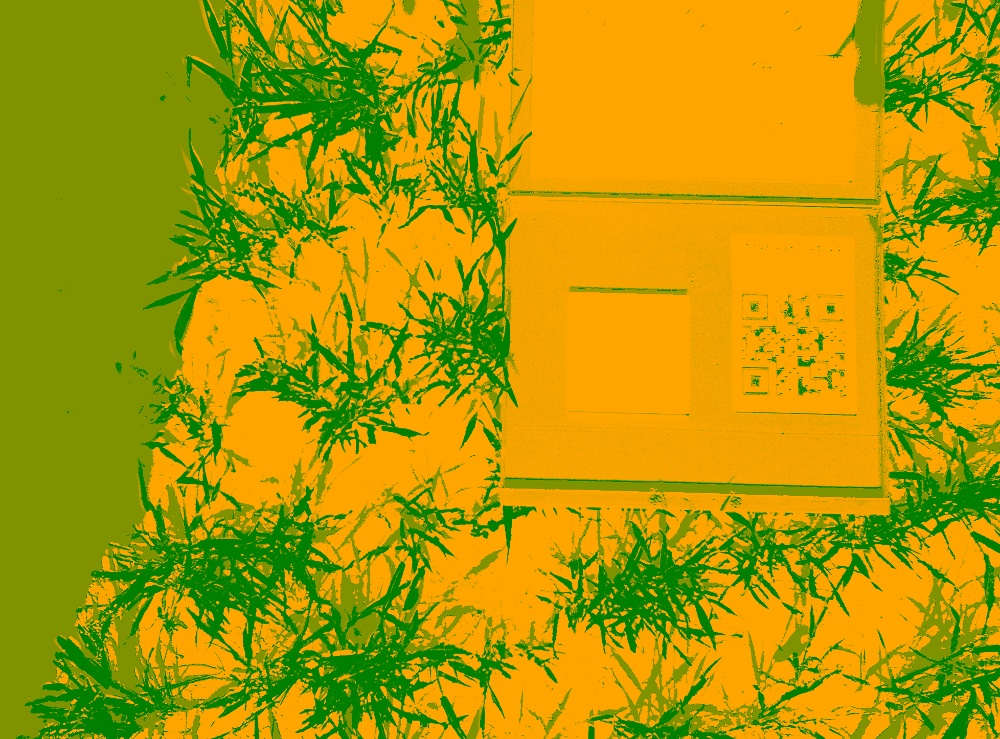

In [20]:
display(PIL.Image.fromarray(maskOnPredictClass(photo, clf, [1, 0.65, 0], [0, 0.5, 0])))
plt.imsave('maskedModelImg.png', maskOnPredictClass(photo, clf, [1, 0.65, 0], [0, 0.5, 0]))

## Overlay initial image with the mask
Recreate the mask with black for soil, white for vegetation and gray for uncertainty.

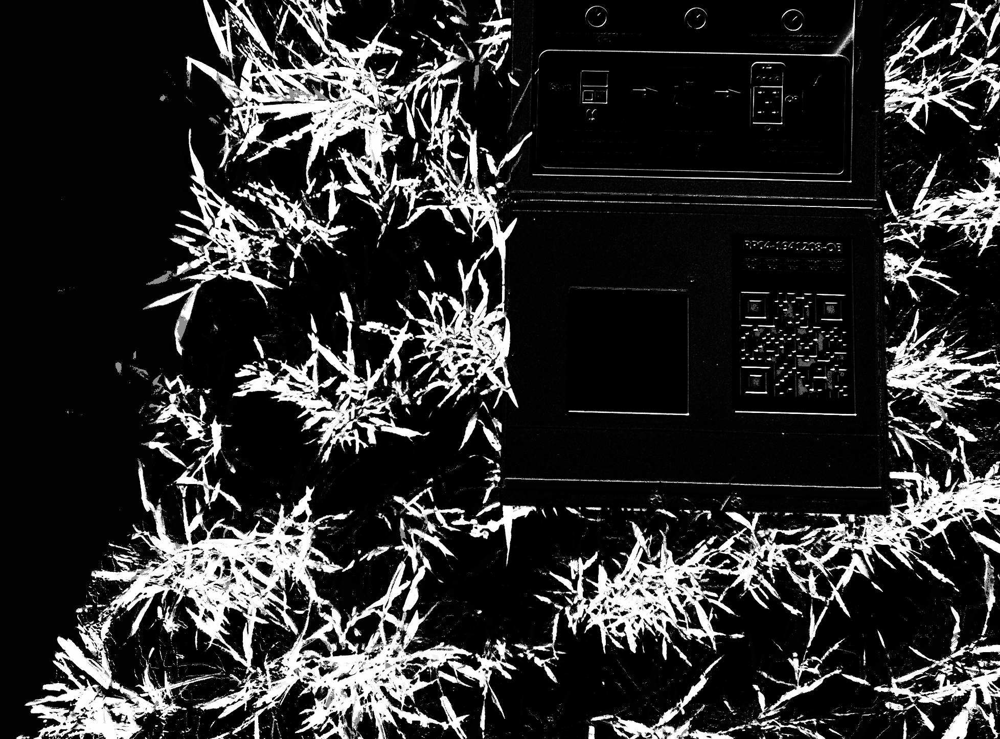

In [35]:
display(PIL.Image.fromarray(maskOnPredictClass(photo, clfAlpha, [0, 0, 0], [1, 1, 1])))
plt.imsave('bAndWMaskedModelImg.png',  maskOnPredictClass(photo, clf, [0, 0, 0], [1, 1, 1]))

#### OpenCV approach, might be interesting to look at

In [22]:
# import cv2
# image = cv2.imread('labeling_project/upload/image.png')
# redImg = np.zeros(image.shape, image.dtype)
# redImg[:,:] = (0, 0, 150)
# redMask = cv2.bitwise_and(redImg, redImg, mask=(bAndWMaskOnPredictClass(sampleimg_rgb)[:,:,0] >= 128).astype(np.uint8))
# a1 = cv2.addWeighted(redMask, 1, image, 1, 0, image)
# cv2.imwrite('maskOverImg.png', a1);

#### Highlight the vegetation with red

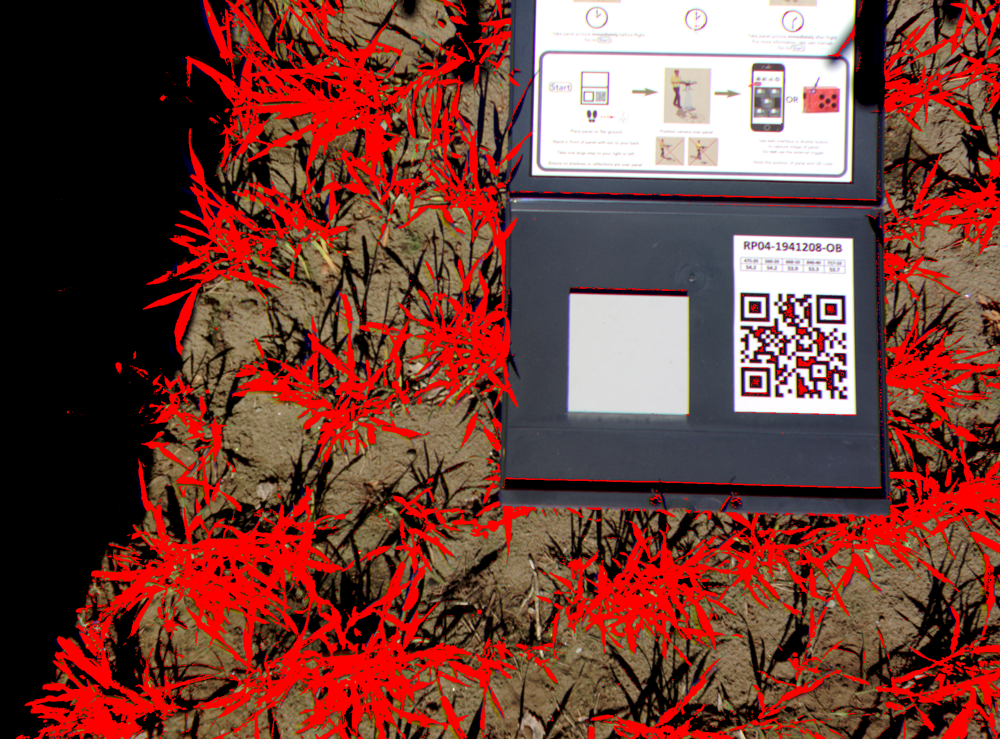

In [23]:
mask = np.array(PIL.Image.open("bAndWMaskedModelImg.png").convert("L"))
a1 = np.where(maskOnPredictClass(photo, clf, [0, 0, 0], [1, 1, 1]) >= 128, np.array([255, 0, 0], dtype=np.uint8), photo)
display(PIL.Image.fromarray(a1))
plt.imsave('maskOverImg1.png', a1)

## Visualise errors in model predictions
Compare manually labelled masks to model labelled masks. Manually labelled vegetation pixels recognized as soil and vice versa are considered errors, whereas uncertainty is not. Highlight errors with white.

#### Vegetation as soil errors:

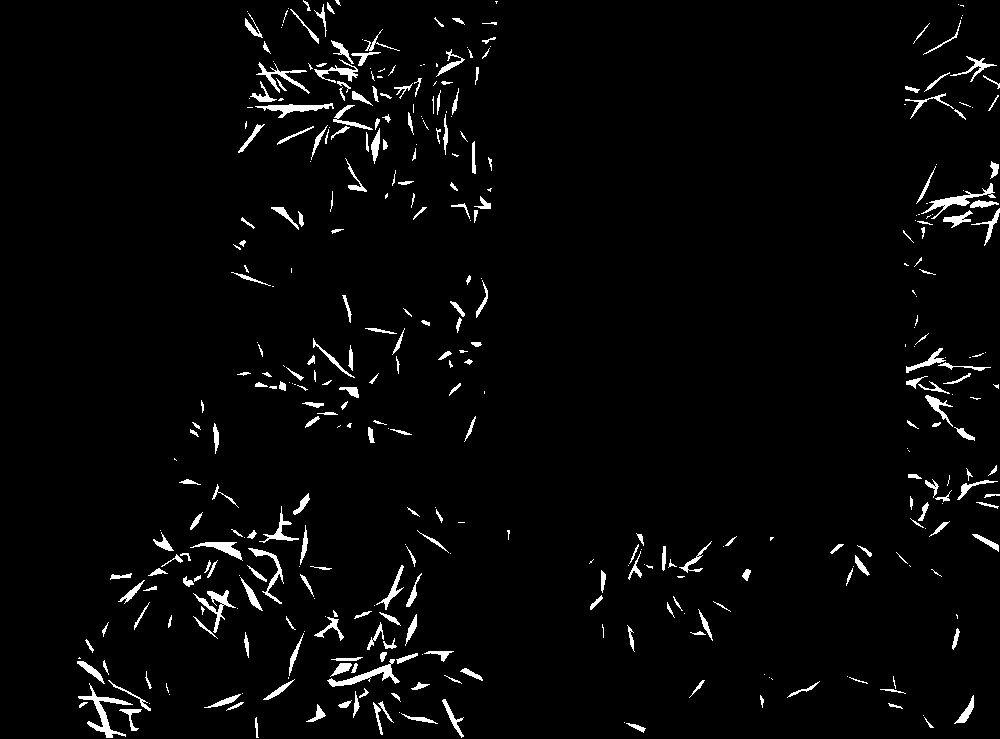

In [24]:
bAndWLabelVegetation = np.zeros((1446, 1956, 3), dtype = np.uint8)
bAndWLabelVegetation[tuple(coordinate("Vegetation"))] = [255,255,255]
bAndWLabelVegetation[tuple(coordinate("Ignore"))] = [0,0,0]
display(PIL.Image.fromarray(bAndWLabelVegetation))
plt.imsave('bAndWLabelVegetation.png', bAndWLabelVegetation)

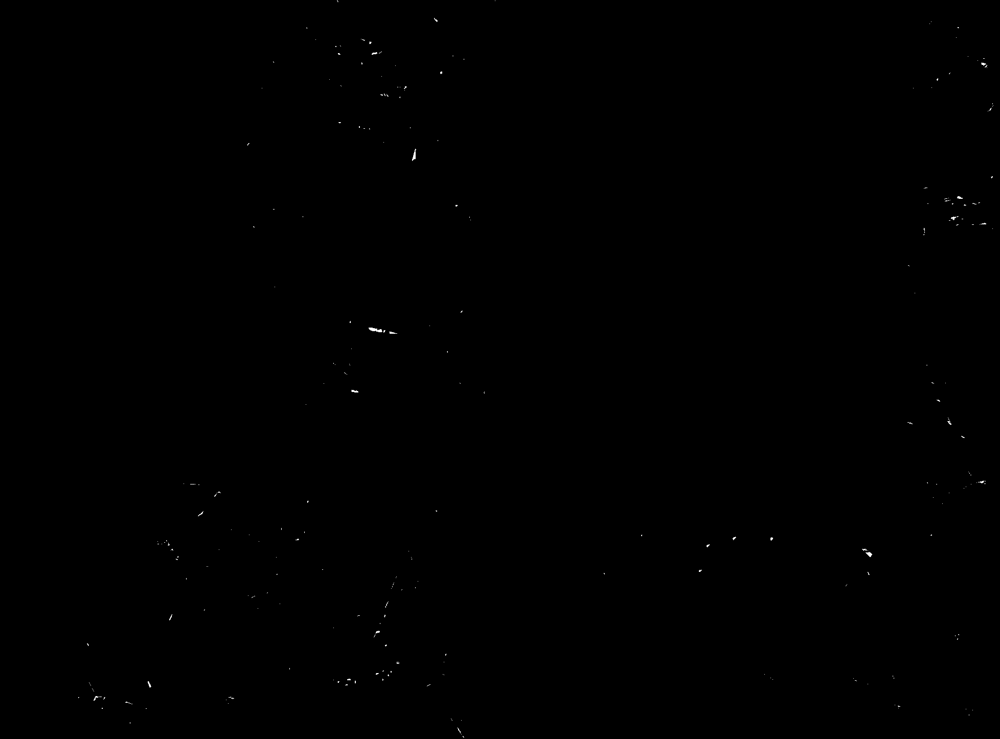

In [25]:
vegetationError = 255 * np.logical_and(bAndWLabelVegetation[:,:,0] >= 128, maskOnPredictClass(photo, clf, [0, 0, 0], [1, 1, 1])[:,:,0] < 128).astype('uint8')
vegetationError = np.stack((vegetationError,)*3, axis=-1)
display(PIL.Image.fromarray(vegetationError))
plt.imsave('vegetationError.png', vegetationError)

#### Soil as vegetation errors:

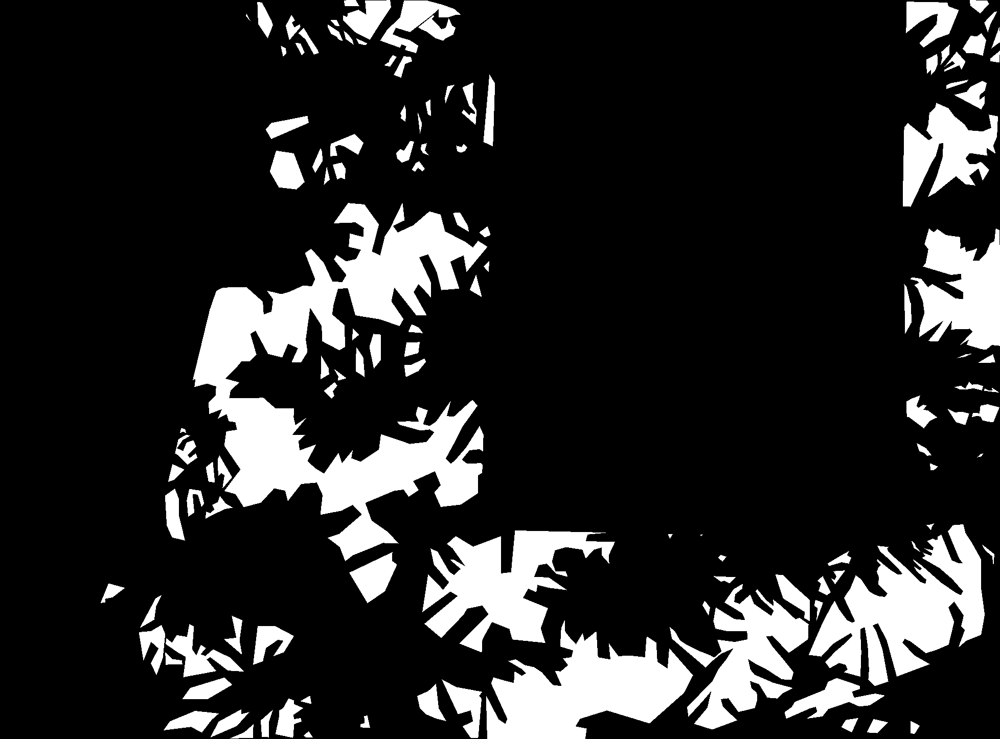

In [26]:
bAndWLabelSoil = np.zeros((1446, 1956, 3), dtype = np.uint8)
bAndWLabelSoil[tuple(coordinate("Soil"))] = [255,255,255]
bAndWLabelSoil[tuple(coordinate("Ignore"))] = [0,0,0]
display(PIL.Image.fromarray(bAndWLabelSoil))
plt.imsave('bAndWLabelSoil.png', bAndWLabelSoil)

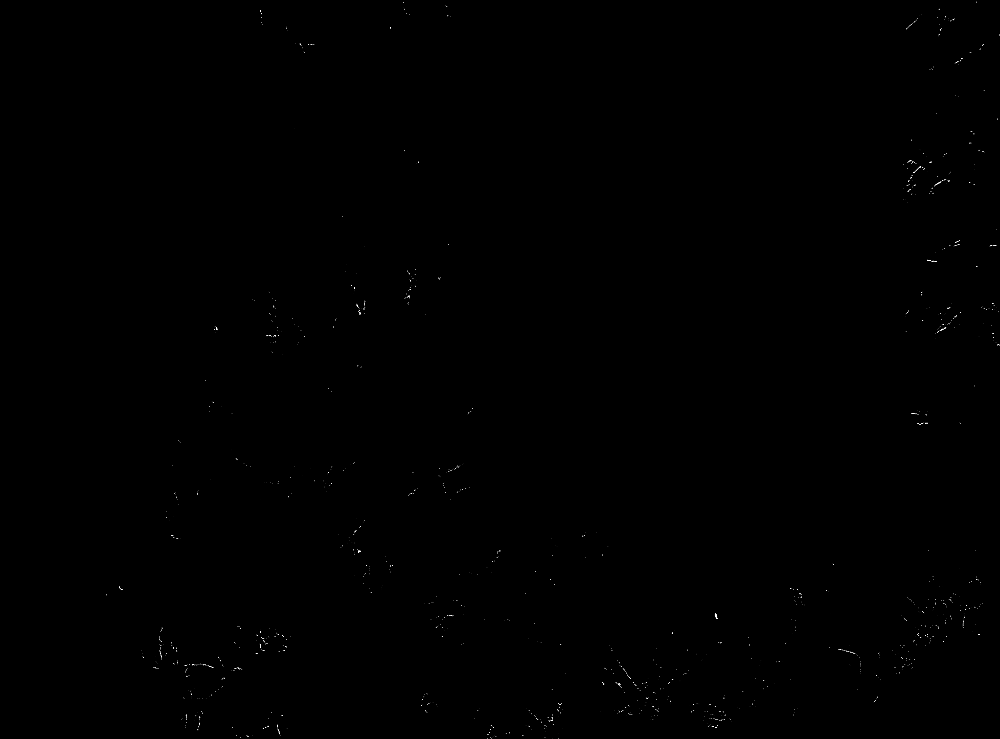

In [27]:
SoilError = 255 * np.logical_and(bAndWLabelSoil[:,:,0] >= 128, 255 - maskOnPredictClass(photo, clf, [0, 0, 0], [1, 1, 1])[:,:,0] < 128).astype('uint8')
SoilError = np.stack((SoilError,)*3, axis=-1)
display(PIL.Image.fromarray(SoilError))
plt.imsave('soilError.png', SoilError)

## Calculate the area of vegetation cover in the non-ignore areas
Add the equal sign to probability threshold to see the difference of labelling the 50% probabilities depending on presence of the intercept. 

#### Without intercept:

Without intercept, probability > 0.5, vegetation coverage area: 0.2978412628749331
Without intercept, probability >= 0.5, vegetation coverage area: 0.4116831017788323


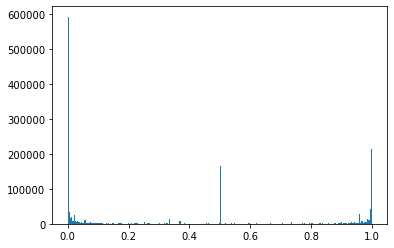

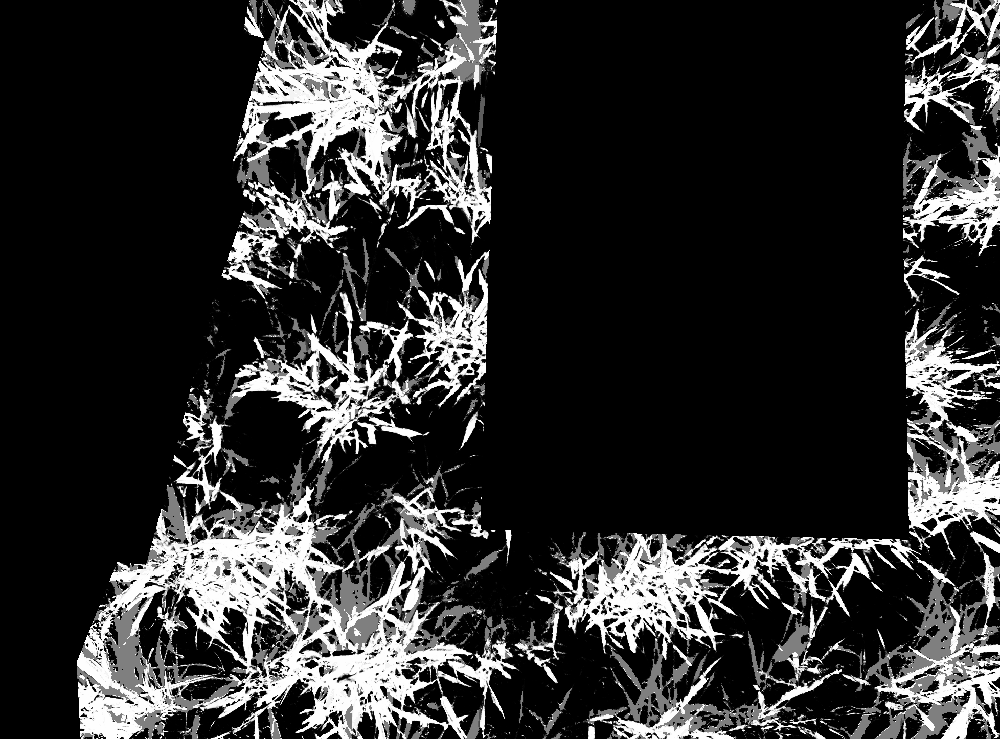

In [36]:
nonIgnoreSelection = selectPixelsInClass(manualClassification, "Ignore") != True
vegP = clf.predict_proba(photo[np.where(nonIgnoreSelection)])[:, 1]
print("Without intercept, probability > 0.5, vegetation coverage area: " + str(np.sum(vegP > 0.5) / np.sum(nonIgnoreSelection)))
print("Without intercept, probability >= 0.5, vegetation coverage area: " + str(np.sum(vegP >= 0.5) / np.sum(nonIgnoreSelection)))
plt.hist(vegP, bins = 256)
plt.show()
a = (maskOnPredictClass(photo, clf, [0, 0, 0], [1, 1, 1]))
a[tuple(coordinate("Ignore"))] = [0,0,0]
display(PIL.Image.fromarray(a))

#### With intercept:

With intercept, probability > 0.5, vegetation coverage area: 0.28858228299480204
With intercept, probability >= 0.5, vegetation coverage area: 0.28858228299480204


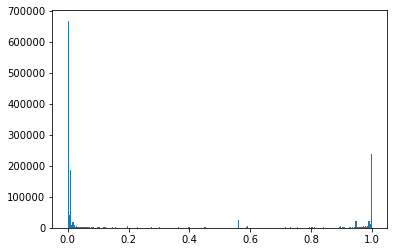

In [33]:
vegP = clfAlpha.predict_proba(photo[np.where(nonIgnoreSelection)])[:, 1]
print("With intercept, probability > 0.5, vegetation coverage area: " + str(np.sum(vegP > 0.5) / np.sum(nonIgnoreSelection)))
print("With intercept, probability >= 0.5, vegetation coverage area: " + str(np.sum(vegP >= 0.5) / np.sum(nonIgnoreSelection)))
plt.hist(vegP, bins = 256);
#a = (maskOnPredictClass(photo, clfAlpha, [0, 0, 0], [1, 1, 1]))
#a[tuple(coordinate("Ignore"))] = [0,0,0]
#display(PIL.Image.fromarray(a))

Basic idea: the discriminator gives the probability of the image being a real image
Generator loss: (1 - D(G(z)))**2
Discriminator loss: (1 - D(R))**2 + D(G(z))**2